##### Installer et importer les bibliothèques suivantes :
- pip install opencv-python
- pip install numpy
- pip install matplotlib

In [16]:
#__________MODULES
import glob
import os
import statistics
import cv2
import numpy as np
from matplotlib import pyplot as plt

IMG_20241028_170311
./Img/IMG_20241028_170311.jpg


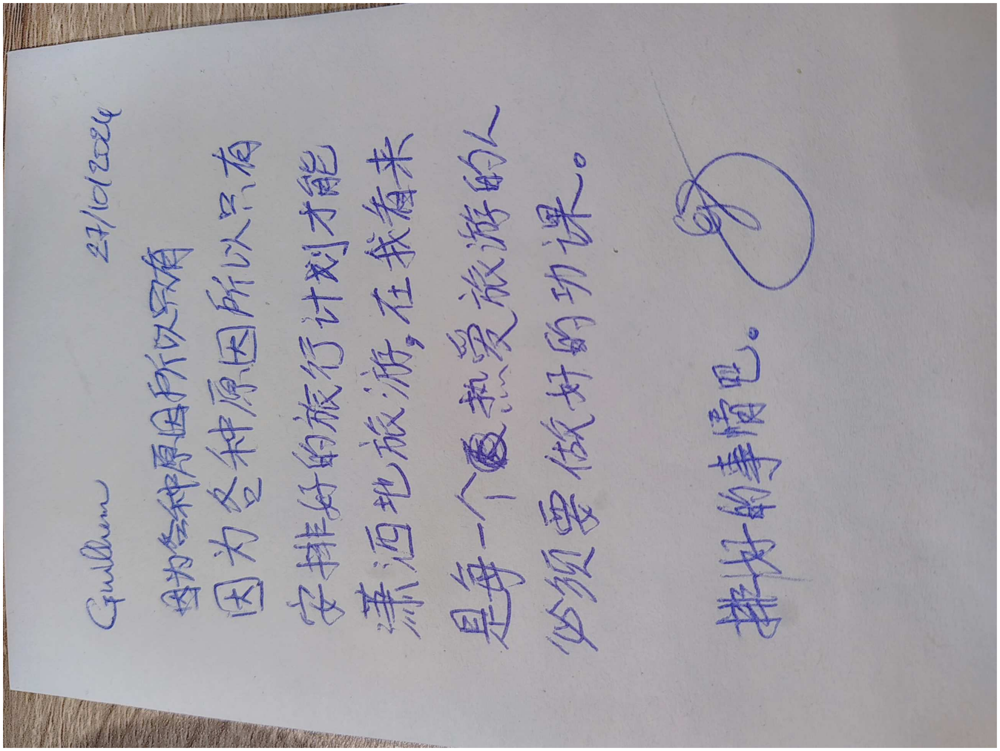

angle=-89.21409606933594
Origin


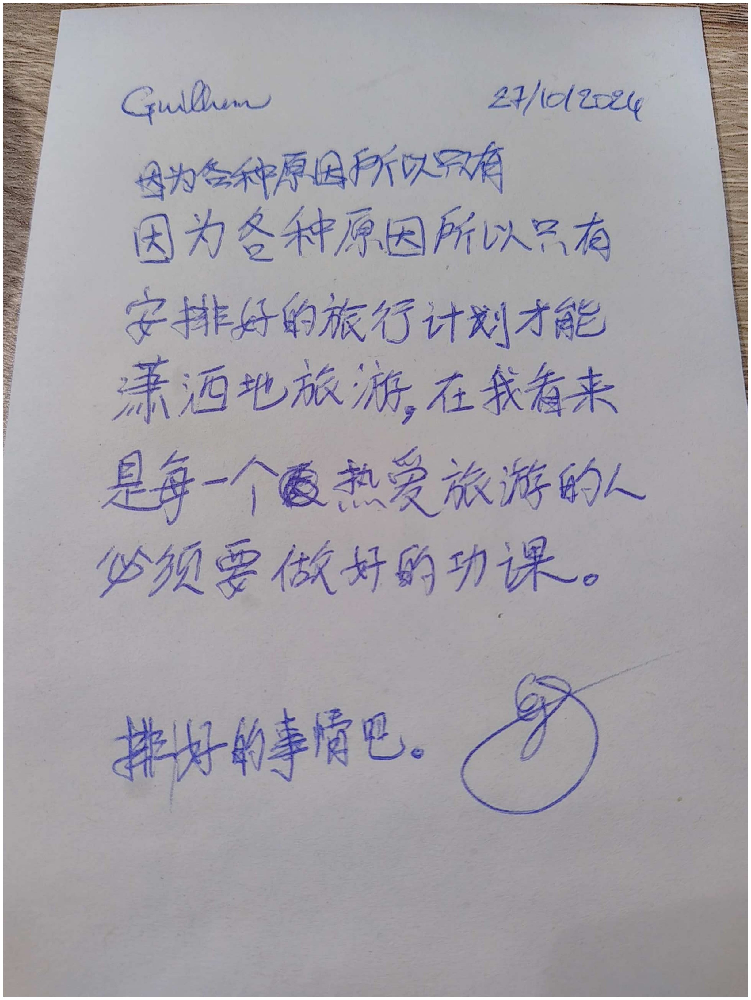

In [17]:
#__________FUNCTIONS

def display(img_path: str) -> None:
    """
    Affiche une image à partir d'un chemin de fichier, en adaptant la taille de la figure pour qu'elle corresponde 
    à celle de l'image en pixels, sans bordures ni axes visibles.

    Parameters:
    img_path (str) : Chemin du fichier de l'image à afficher.

    """

    dpi = 80  # Définir la résolution en points par pouce (DPI).
    image = plt.imread(img_path) # Lire l'image à partir du chemin de fichier spécifié.
    height, width  = image.shape[:2] # Obtenir la hauteur et la largeur de l'image en pixels.
    figsize = width / float(dpi), height / float(dpi) # Calculer la taille de la figure en pouces
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off') # Masquer les axes, bordures, et repères
    ax.imshow(image, cmap='gray')
    plt.show() # Afficher l"image


def empty_directory(path: str) -> None:
    """
    Supprime tous les fichiers et sous-répertoires vides dans un répertoire donné.

    Parameter:
    path (str) : Chemin du répertoire à vider.
    """

    # Vérifie si le chemin est un répertoire
    if not os.path.isdir(path):
        raise ValueError(f"{path} n'est pas un répertoire valide.")

    for file_name in os.listdir(path):
        file_path = os.path.join(path, file_name)
        if os.path.isfile(file_path):
            try:
                os.remove(file_path)
            except Exception as e:
                print(f"Erreur lors de la suppression de {file_path}: {e}")
        elif os.path.isdir(file_path):
            try:
                # Appel récursif pour vider le sous-répertoire
                empty_directory(file_path)
                os.rmdir(file_path)  # Supprime le répertoire après l'avoir vidé
            except Exception as e:
                print(f"Erreur lors de la suppression de {file_path}: {e}")


def getSkewAngle(cvImage) -> float:
    """
    Calcule l'angle de déformation d'une image contenant du texte en détectant l'inclinaison de ses lignes 
    principales. Cette méthode utilise le traitement d'image pour trouver les contours et déterminer l'angle 
    de rotation nécessaire pour redresser le texte.

    Parameter:
    cvImage (ndarray) : Image en couleur au format OpenCV.

    Return:
    float : Angle d'inclinaison (en degrés) à appliquer pour redresser l'image.
    """
    
    # Préparer l'image : copier, convertir en niveaux de gris, flouter et appliquer un seuillage.    newImage = cvImage.copy()
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Appliquer une dilatation pour fusionner le texte en lignes/paragraphes significatifs.
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Trouver tous les contours de l'image.
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Trouver le plus grand contour et l'encadrer dans un rectangle d'aire minimale.
    largestContour = contours[0]
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("./Temp/boxes.jpg", newImage)

    # Calculer l'angle d'inclinaison et le convertir pour correspondre à l'angle d'origine.
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle


def rotateImage(cvImage, angle: float):
    """
    Fait pivoter une image autour de son centre selon un angle donné, en conservant les dimensions d'origine.

    Parameters:
    cvImage (ndarray) : Image au format OpenCV à faire pivoter.
    angle (float) : Angle de rotation en degrés. Une valeur positive tourne l'image dans le sens anti-horaire,
                    et une valeur négative dans le sens horaire.

    Return:
    ndarray : Nouvelle image tournée.
    """

    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage


def deskew(cvImage):
    """
    Corrige l'inclinaison d'une image en détectant et appliquant une rotation pour redresser le texte.

    Parameter:
    cvImage (ndarray) : Image au format OpenCV nécessitant une correction d'inclinaison.

    Return:
    ndarray : Nouvelle image redressée si une inclinaison est détectée, sinon l'image d'origine.
    """
    angle = getSkewAngle(cvImage)
    print(f"{angle=}")
    if angle >= 2.0 and angle <= 88.0 or angle <= -2.0 and angle >= -88.0:
        print("Rotate")
        return rotateImage(cvImage, -1.0 * angle)
    else:
        print("Origin")
        return cvImage

#__________CALL

img_directory = "./Img/*.jpg"

empty_directory("./Char")

count_file = 0
for img_file in glob.glob(img_directory)[-1:]: 

    file_name = img_file.split("/")[-1].split(".")[0]
    print(file_name)
    if os.path.exists(f"./Char/{file_name}"):
        pass
    else:
        os.mkdir(f"./Char/{file_name}")

    count_file += 1
    print(img_file)

    display(img_file)
    img = cv2.imread(img_file)

    # Tourner le fichier dans le bon sens si nécessaire
    fixed = deskew(img)
    fixed_file = "./Temp/rotated_fixed.jpg"
    cv2.imwrite(fixed_file, fixed) # Sauvegarder 
    display(fixed_file) # Afficher

### Step 2 : Segmenter ligne par ligne
Pour extraire chaque ligne de texte de l'image, on cherche toutes les formes sur notre image. Pour éliminer la plupart des micro sélections on extrait uniquement les formes dont la largeur et la hauteur sont supérieur à la moyenne. Enfin on extrait les selections grâce à ses coordonnées.

avrg_width=326, avrg_height=116
(1227, 198, 485, 120)


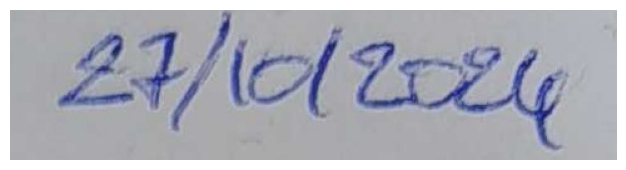

(270, 198, 477, 128)


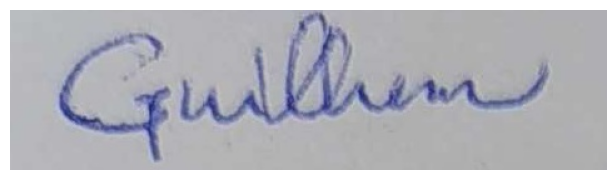

(307, 357, 1048, 167)


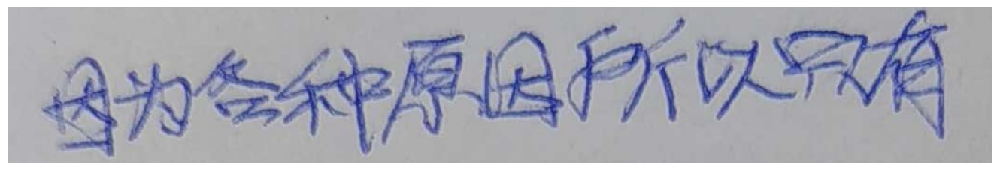

(303, 525, 1330, 163)


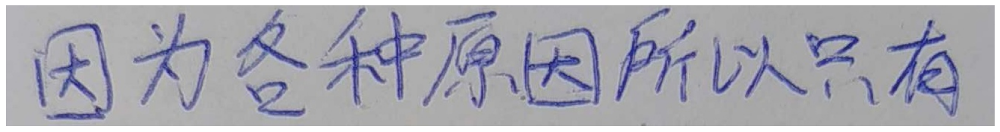

(281, 737, 1341, 175)


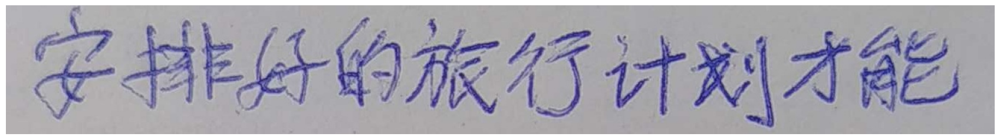

(249, 915, 1403, 193)


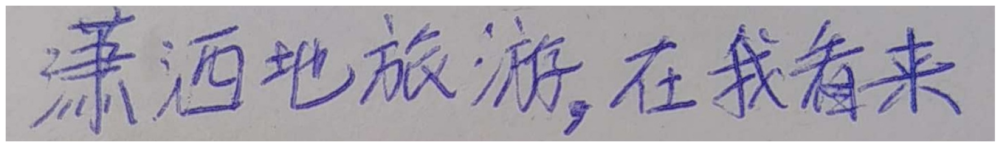

(219, 1153, 1507, 218)


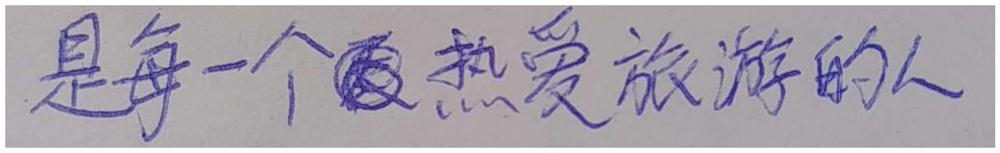

(205, 1386, 1398, 178)


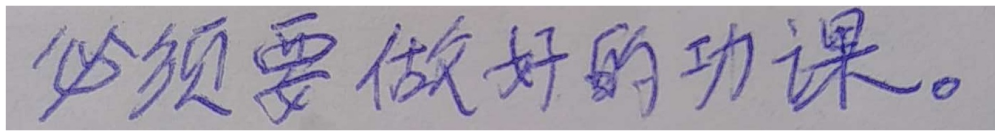

(1155, 1744, 449, 382)


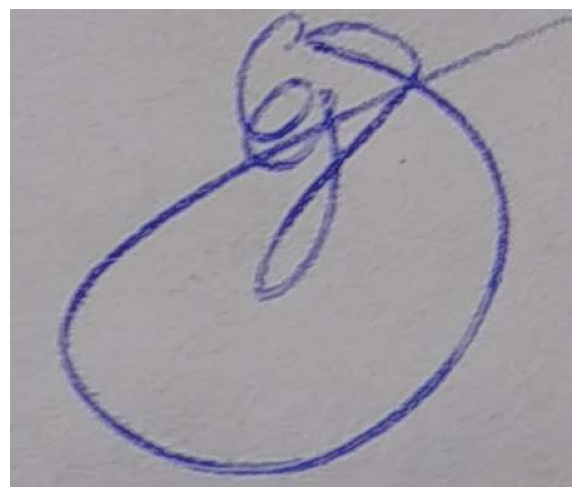

(246, 1835, 901, 205)


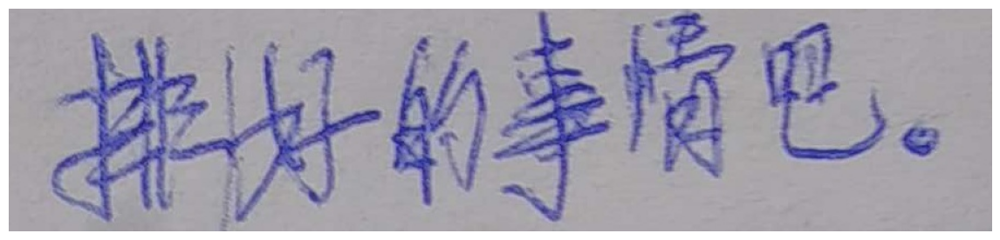

(1250, 1861, 257, 240)


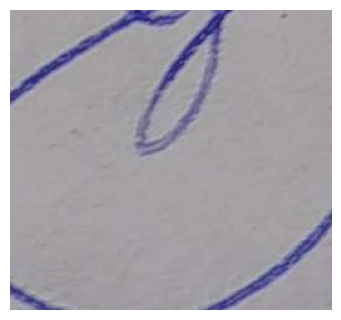

(1495, 2447, 449, 145)


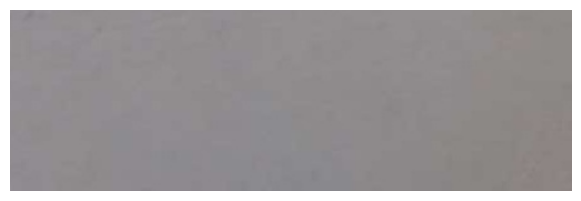

In [20]:
#__________FUNCTIONS

def get_selection(cvImage) -> list:
    """
    Extrait les contours des blocs de texte d'une image et retourne une liste de rectangles entourant chaque bloc.
    Calcule également la largeur et la hauteur moyennes des rectangles.

    Parameter:
    cvImage (ndarray) : Image au format OpenCV contenant le texte à segmenter.

    Return:
    tuple : Contient la liste des rectangles (x, y, w, h) entourant chaque bloc de texte, 
            ainsi que la largeur moyenne (int) et la hauteur moyenne (int) des rectangles.
    """

    list_rectangle = list()

    newImage = cvImage.copy() # Copier l'image en input
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY) # Image en niveau de gris
    #cv2.imwrite("./Temp/gray.jpg", gray) # Sauvegarder
    blur = cv2.GaussianBlur(gray, (9, 9), 0) # Floutage de l'image
    #cv2.imwrite("./Temp/blur.jpg", blur) # Sauvegarder
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1] # Inversion des byte
    #cv2.imwrite("./Temp/thresh.jpg", thresh) # Sauvegarder
    no_noise = noise_removal(thresh) # Débruitage de l'image
    #cv2.imwrite("./Temp/no_noice.jpg", no_noise) # Sauvegarder

    # Appliquer une dilatation pour fusionner les caractères en lignes ou paragraphes significatifs.
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(no_noise, kernel, iterations=3) # Dilatation des formes
    #cv2.imwrite("./Temp/dilate.jpg", dilate) # Sauvegarder

    # Trouve le contour des formes
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    
    average_w = list()
    average_h = list()
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        average_h.append(h)
        average_w.append(w)
        list_rectangle.append(rect)

    average_w = int(statistics.mean(average_w))
    average_h = int(statistics.mean(average_h))

    return list_rectangle, average_w, average_h


def noise_removal(image):
    """
    Réduit le bruit d'une image binaire en utilisant une série d'opérations morphologiques.
    La fonction applique des dilatations et des érosions pour combiner les pixels du texte, 
    puis effectue une fermeture morphologique et un flou médian pour lisser l'image.

    Parameter:
    image (ndarray) : Image binaire au format OpenCV nécessitant un débruitage.

    Return:
    ndarray : Image nettoyée sans bruit.
    """

    parameter = 2 # Init param :1
    blur_param = 5 # Init param : 3
    import numpy as np
    kernel = np.ones((parameter, parameter), np.uint8) 
    image = cv2.dilate(image, kernel, iterations=parameter)
    kernel = np.ones((parameter, parameter), np.uint8)
    image = cv2.erode(image, kernel, iterations=parameter)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, blur_param)
    return (image)

#__________CALL

rectangle_selection, avrg_width, avrg_height = get_selection(fixed)
print(f"{avrg_width=}, {avrg_height=}")    

rectangle_selection = sorted(rectangle_selection, key=lambda x: x[1])

empty_directory('./Cropped')

count_selection = 0
for rectangle in rectangle_selection:
    x = rectangle[0]
    y = rectangle[1]
    width = rectangle[2]
    height = rectangle[3]
    if width > avrg_width/2 and height > avrg_height/2 and height < avrg_height*4 :
        print(rectangle)
        cropped_image = fixed[y:y + height, x:x + width] # Découper l'image
        cropped_file = f"./Cropped/img_{count_selection}.jpg"
        cv2.imwrite(cropped_file, cropped_image) # Sauvegarder
        display(cropped_file) # Afficher
        count_selection += 1


### Step 3 : Segmenter la phrase en caractères chinois
Pour extraire chaque caractère de la phrase on s'appuie sur les espaces entre caractères pour segmenter la phrase. Lorsque le segment est plus petit que la hauteur de l'image alors c'est un caractère, puis on calcule la largeur moyenne des caratères unique. Grâce à cette moyenne on peut tenter de prédire et d'extraire les caractères non reconnnu des segments plus long.

./Cropped/img_0.jpg
height_img=120, width_img=485


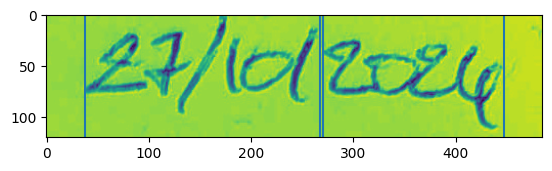

./Cropped/img_1.jpg
height_img=128, width_img=477


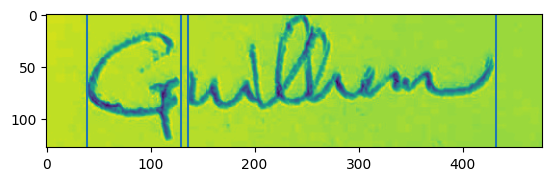

unclassed=[(135, 431, 296)]
unique=[(38, 128, 90)]
segments=[(38, 128, 90), (135, 431, 296)]
punct=[]
Largeurs : [90]
Moyenne : 90
single_characters=[(135, 233, 98), (233, 331, 98), (331, 429, 98)]
Nombre de caractère prédit par image: 4, [(38, 128, 90), (135, 233, 98), (233, 331, 98), (331, 429, 98)]
(38, 128, 90)
char_clean=[(0, 16, 90, 112)], char_width=90, char_height=112


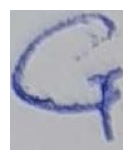

(135, 233, 98)
char_clean=[(0, 15, 98, 85)], char_width=98, char_height=85


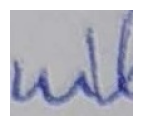

(233, 331, 98)
char_clean=[(0, 0, 98, 96)], char_width=98, char_height=96


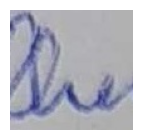

(331, 429, 98)
char_clean=[(0, 43, 98, 45)], char_width=98, char_height=45


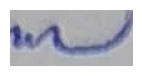

./Cropped/img_2.jpg
height_img=167, width_img=1048


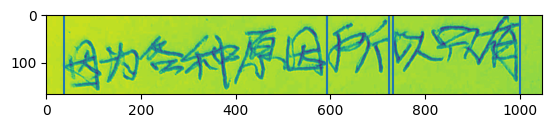

unclassed=[(36, 591, 555), (732, 1000, 268)]
unique=[(593, 723, 130)]
segments=[(36, 591, 555), (593, 723, 130), (732, 1000, 268)]
punct=[]
Largeurs : [130]
Moyenne : 130
single_characters=[(36, 174, 138), (174, 312, 138), (312, 450, 138), (450, 588, 138), (732, 866, 134), (866, 1000, 134)]
Nombre de caractère prédit par image: 7, [(36, 174, 138), (174, 312, 138), (312, 450, 138), (450, 588, 138), (593, 723, 130), (732, 866, 134), (866, 1000, 134)]
(36, 174, 138)
char_clean=[(0, 50, 138, 117)], char_width=138, char_height=117


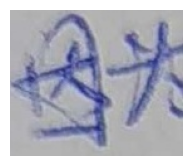

(174, 312, 138)
char_clean=[(0, 43, 138, 104)], char_width=138, char_height=104


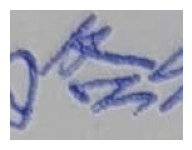

(312, 450, 138)
char_clean=[(0, 32, 138, 133)], char_width=138, char_height=133


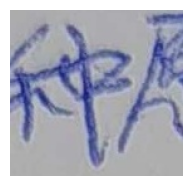

(450, 588, 138)
char_clean=[(0, 23, 138, 122)], char_width=138, char_height=122


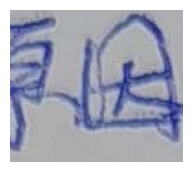

(593, 723, 130)
char_clean=[(0, 9, 130, 122)], char_width=130, char_height=122


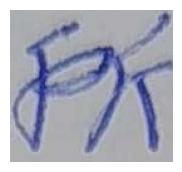

(732, 866, 134)
char_clean=[(0, 21, 134, 107)], char_width=134, char_height=107


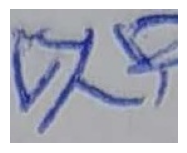

(866, 1000, 134)
char_clean=[(0, 0, 134, 149)], char_width=134, char_height=149


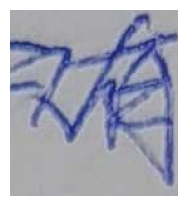

./Cropped/img_3.jpg
height_img=163, width_img=1330


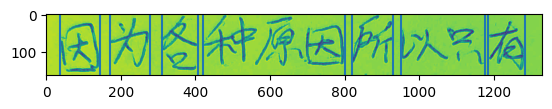

unclassed=[(419, 800, 381), (949, 1175, 226)]
unique=[(36, 144, 108), (170, 276, 106), (309, 405, 96), (819, 930, 111), (1183, 1282, 99)]
segments=[(36, 144, 108), (170, 276, 106), (309, 405, 96), (419, 800, 381), (819, 930, 111), (949, 1175, 226), (1183, 1282, 99)]
punct=[]
Largeurs : [108, 106, 96, 111, 99]
Moyenne : 104
single_characters=[(419, 514, 95), (514, 609, 95), (609, 704, 95), (704, 799, 95), (949, 1062, 113), (1062, 1175, 113)]
Nombre de caractère prédit par image: 11, [(36, 144, 108), (170, 276, 106), (309, 405, 96), (419, 514, 95), (514, 609, 95), (609, 704, 95), (704, 799, 95), (819, 930, 111), (949, 1062, 113), (1062, 1175, 113), (1183, 1282, 99)]
(36, 144, 108)
char_clean=[(0, 21, 108, 142)], char_width=108, char_height=142


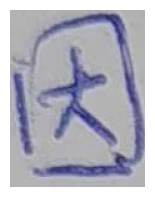

(170, 276, 106)
char_clean=[(0, 8, 106, 142)], char_width=106, char_height=142


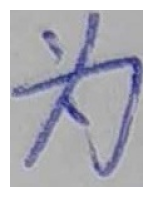

(309, 405, 96)
char_clean=[(0, 3, 96, 156)], char_width=96, char_height=156


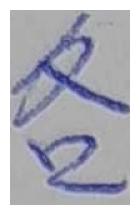

(419, 514, 95)
char_clean=[(0, 0, 95, 142)], char_width=95, char_height=142


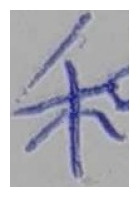

(514, 609, 95)
char_clean=[(0, 6, 95, 138)], char_width=95, char_height=138


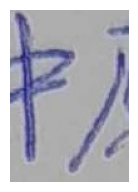

(609, 704, 95)
char_clean=[(0, 4, 95, 143)], char_width=95, char_height=143


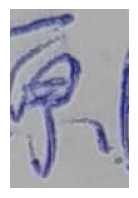

(704, 799, 95)
char_clean=[(0, 27, 95, 119)], char_width=95, char_height=119


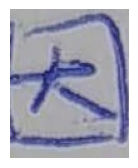

(819, 930, 111)
char_clean=[(0, 0, 111, 139)], char_width=111, char_height=139


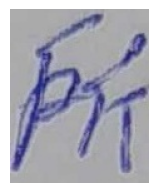

(949, 1062, 113)
char_clean=[(0, 39, 113, 94)], char_width=113, char_height=94


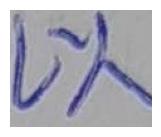

(1062, 1175, 113)
char_clean=[(0, 35, 113, 57), (0, 93, 113, 49)], char_width=113, char_height=53


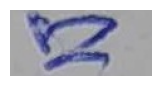

(1183, 1282, 99)
char_clean=[(0, 17, 99, 141)], char_width=99, char_height=141


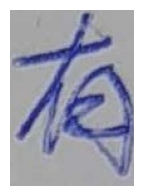

./Cropped/img_4.jpg
height_img=175, width_img=1341


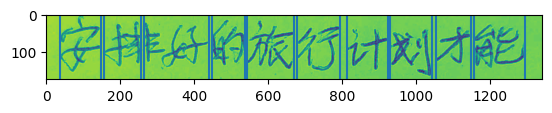

unclassed=[(263, 439, 176)]
unique=[(37, 147, 110), (154, 256, 102), (446, 535, 89), (541, 668, 127), (678, 793, 115), (812, 922, 110), (927, 1041, 114), (1053, 1146, 93), (1156, 1292, 136)]
segments=[(37, 147, 110), (154, 256, 102), (263, 439, 176), (446, 535, 89), (541, 668, 127), (678, 793, 115), (812, 922, 110), (927, 1041, 114), (1053, 1146, 93), (1156, 1292, 136)]
punct=[]
Largeurs : [110, 102, 89, 127, 115, 110, 114, 93, 136]
Moyenne : 110
single_characters=[(263, 439, 176)]
Nombre de caractère prédit par image: 10, [(37, 147, 110), (154, 256, 102), (263, 439, 176), (446, 535, 89), (541, 668, 127), (678, 793, 115), (812, 922, 110), (927, 1041, 114), (1053, 1146, 93), (1156, 1292, 136)]
(37, 147, 110)
char_clean=[(0, 0, 110, 163)], char_width=110, char_height=163


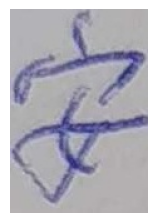

(154, 256, 102)
char_clean=[(0, 17, 102, 132)], char_width=102, char_height=132


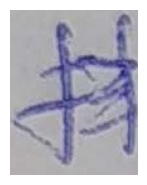

(263, 439, 176)
char_clean=[(0, 21, 176, 128)], char_width=176, char_height=128


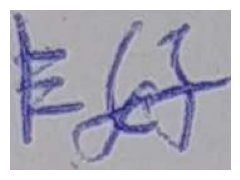

(446, 535, 89)
char_clean=[(0, 13, 89, 133)], char_width=89, char_height=133


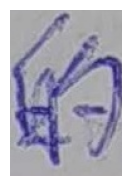

(541, 668, 127)
char_clean=[(0, 16, 127, 140)], char_width=127, char_height=140


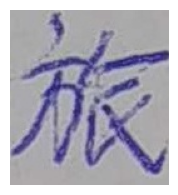

(678, 793, 115)
char_clean=[(0, 30, 115, 131)], char_width=115, char_height=131


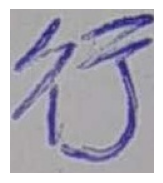

(812, 922, 110)
char_clean=[(0, 40, 110, 118)], char_width=110, char_height=118


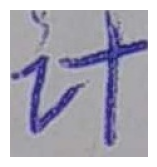

(927, 1041, 114)
char_clean=[(0, 40, 114, 135)], char_width=114, char_height=135


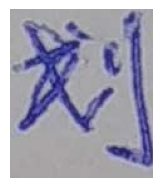

(1053, 1146, 93)
char_clean=[(0, 32, 93, 109)], char_width=93, char_height=109


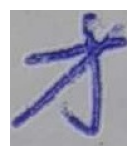

(1156, 1292, 136)
char_clean=[(0, 26, 136, 125)], char_width=136, char_height=125


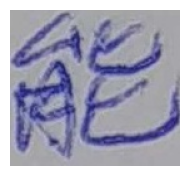

./Cropped/img_5.jpg
height_img=193, width_img=1403


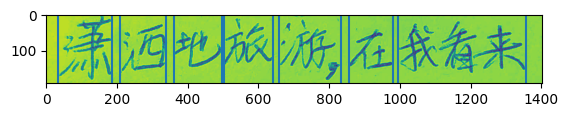

unclassed=[(994, 1355, 361)]
unique=[(32, 186, 154), (207, 338, 131), (360, 495, 135), (501, 639, 138), (658, 833, 175), (855, 980, 125)]
segments=[(32, 186, 154), (207, 338, 131), (360, 495, 135), (501, 639, 138), (658, 833, 175), (855, 980, 125), (994, 1355, 361)]
punct=[]
Largeurs : [154, 131, 135, 138, 175, 125]
Moyenne : 143
single_characters=[(994, 1114, 120), (1114, 1234, 120), (1234, 1354, 120)]
Nombre de caractère prédit par image: 9, [(32, 186, 154), (207, 338, 131), (360, 495, 135), (501, 639, 138), (658, 833, 175), (855, 980, 125), (994, 1114, 120), (1114, 1234, 120), (1234, 1354, 120)]
(32, 186, 154)
char_clean=[(0, 0, 154, 192)], char_width=154, char_height=192


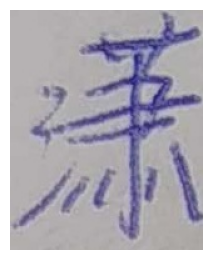

(207, 338, 131)
char_clean=[(0, 26, 131, 141)], char_width=131, char_height=141


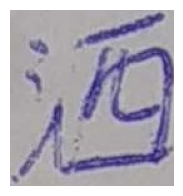

(360, 495, 135)
char_clean=[(0, 45, 135, 112)], char_width=135, char_height=112


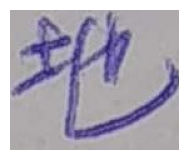

(501, 639, 138)
char_clean=[(0, 11, 138, 139)], char_width=138, char_height=139


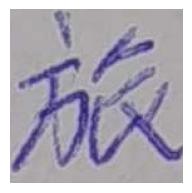

(658, 833, 175)
char_clean=[(0, 15, 175, 178)], char_width=175, char_height=178


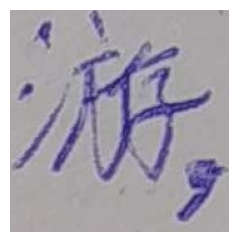

(855, 980, 125)
char_clean=[(0, 44, 125, 119)], char_width=125, char_height=119


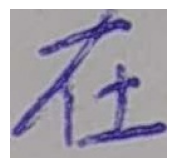

(994, 1114, 120)
char_clean=[(0, 25, 120, 144)], char_width=120, char_height=144


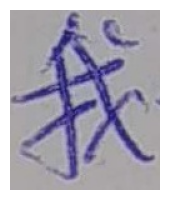

(1114, 1234, 120)
char_clean=[(0, 18, 120, 155)], char_width=120, char_height=155


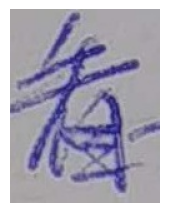

(1234, 1354, 120)
char_clean=[(0, 30, 120, 134)], char_width=120, char_height=134


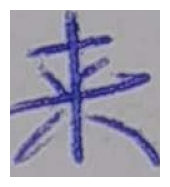

./Cropped/img_6.jpg
height_img=218, width_img=1507


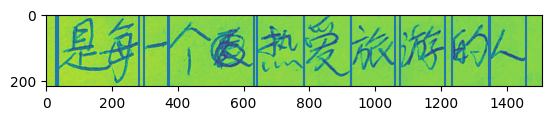

unclassed=[(36, 281, 245), (372, 631, 259)]
unique=[(297, 368, 71), (639, 782, 143), (783, 924, 141), (925, 1060, 135), (1075, 1210, 135), (1231, 1344, 113), (1348, 1458, 110)]
segments=[(28, 35, 7), (36, 281, 245), (297, 368, 71), (372, 631, 259), (639, 782, 143), (783, 924, 141), (925, 1060, 135), (1075, 1210, 135), (1231, 1344, 113), (1348, 1458, 110)]
punct=[]
Largeurs : [71, 143, 141, 135, 135, 113, 110]
Moyenne : 121
single_characters=[(36, 158, 122), (158, 280, 122), (372, 501, 129), (501, 630, 129)]
Nombre de caractère prédit par image: 11, [(36, 158, 122), (158, 280, 122), (297, 368, 71), (372, 501, 129), (501, 630, 129), (639, 782, 143), (783, 924, 141), (925, 1060, 135), (1075, 1210, 135), (1231, 1344, 113), (1348, 1458, 110)]
(36, 158, 122)
char_clean=[(0, 9, 122, 172)], char_width=122, char_height=172


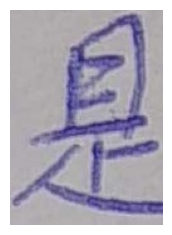

(158, 280, 122)
char_clean=[(0, 10, 122, 208)], char_width=122, char_height=208


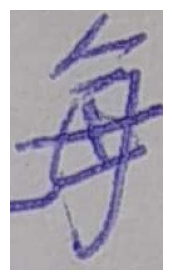

(297, 368, 71)
char_clean=[(0, 80, 71, 32)], char_width=71, char_height=32


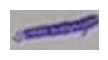

(372, 501, 129)
char_clean=[(0, 24, 129, 169)], char_width=129, char_height=169


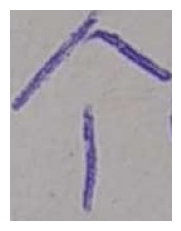

(501, 630, 129)
char_clean=[(0, 37, 129, 135)], char_width=129, char_height=135


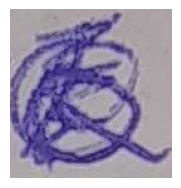

(639, 782, 143)
char_clean=[(0, 32, 143, 152)], char_width=143, char_height=152


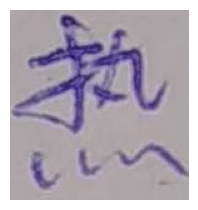

(783, 924, 141)
char_clean=[(0, 0, 141, 198)], char_width=141, char_height=198


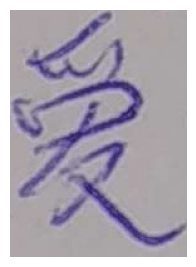

(925, 1060, 135)
char_clean=[(0, 31, 135, 147)], char_width=135, char_height=147


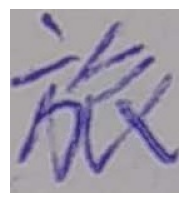

(1075, 1210, 135)
char_clean=[(0, 31, 135, 146)], char_width=135, char_height=146


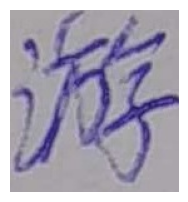

(1231, 1344, 113)
char_clean=[(0, 29, 113, 140)], char_width=113, char_height=140


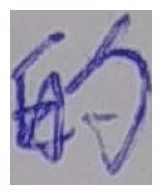

(1348, 1458, 110)
char_clean=[(0, 44, 110, 108)], char_width=110, char_height=108


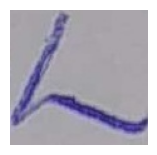

./Cropped/img_7.jpg
height_img=178, width_img=1398


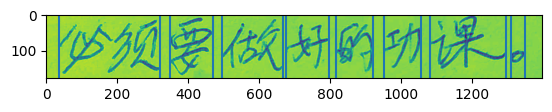

unclassed=[(36, 319, 283), (1081, 1295, 214)]
unique=[(349, 468, 119), (493, 666, 173), (674, 795, 121), (815, 921, 106), (951, 1056, 105)]
segments=[(36, 319, 283), (349, 468, 119), (493, 666, 173), (674, 795, 121), (815, 921, 106), (951, 1056, 105), (1081, 1295, 214), (1308, 1349, 41)]
punct=[(1308, 1349, 41)]
Largeurs : [119, 173, 121, 106, 105]
Moyenne : 124
single_characters=[(36, 177, 141), (177, 318, 141), (1081, 1295, 214)]
Nombre de caractère prédit par image: 9, [(36, 177, 141), (177, 318, 141), (349, 468, 119), (493, 666, 173), (674, 795, 121), (815, 921, 106), (951, 1056, 105), (1081, 1295, 214), (1308, 1349, 41)]
(36, 177, 141)
char_clean=[(0, 26, 141, 149)], char_width=141, char_height=149


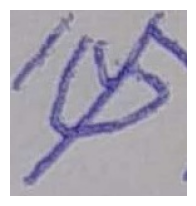

(177, 318, 141)
char_clean=[(0, 14, 141, 158)], char_width=141, char_height=158


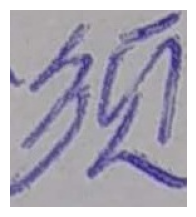

(349, 468, 119)
char_clean=[(0, 7, 119, 171)], char_width=119, char_height=171


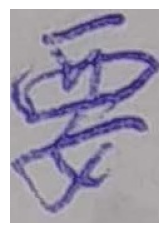

(493, 666, 173)
char_clean=[(0, 12, 173, 155)], char_width=173, char_height=155


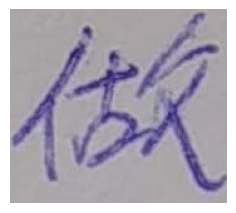

(674, 795, 121)
char_clean=[(0, 26, 121, 133)], char_width=121, char_height=133


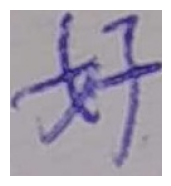

(815, 921, 106)
char_clean=[(0, 23, 106, 144)], char_width=106, char_height=144


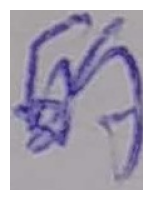

(951, 1056, 105)
char_clean=[(0, 24, 105, 134)], char_width=105, char_height=134


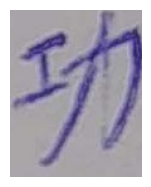

(1081, 1295, 214)
char_clean=[(0, 0, 214, 160)], char_width=214, char_height=160


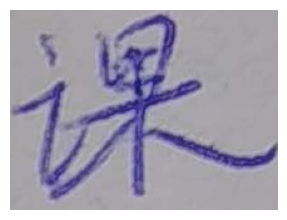

(1308, 1349, 41)
char_clean=[(0, 99, 41, 45)], char_width=41, char_height=45


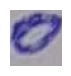

./Cropped/img_8.jpg
height_img=382, width_img=449


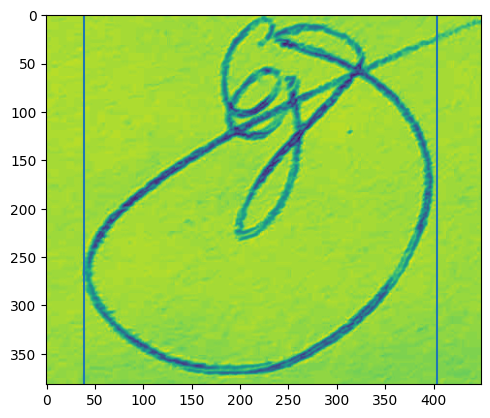

unclassed=[]
unique=[(38, 403, 365)]
segments=[(38, 403, 365)]
punct=[]
Largeurs : [365]
Moyenne : 365
single_characters=[]
Nombre de caractère prédit par image: 1, [(38, 403, 365)]
(38, 403, 365)
char_clean=[(0, 0, 365, 382), (56, 116, 259, 241), (131, 180, 3, 3)], char_width=209, char_height=208


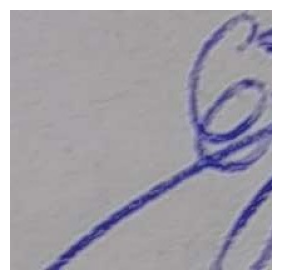

./Cropped/img_9.jpg
height_img=205, width_img=901


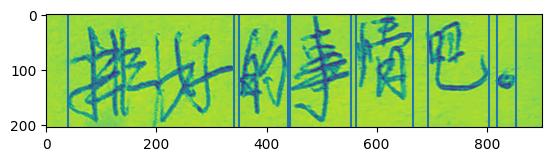

unclassed=[(38, 340, 302)]
unique=[(349, 438, 89), (441, 553, 112), (561, 665, 104), (693, 803, 110)]
segments=[(38, 340, 302), (349, 438, 89), (441, 553, 112), (561, 665, 104), (693, 803, 110), (817, 852, 35)]
punct=[(817, 852, 35)]
Largeurs : [89, 112, 104, 110]
Moyenne : 103
single_characters=[(38, 138, 100), (138, 238, 100), (238, 338, 100)]
Nombre de caractère prédit par image: 8, [(38, 138, 100), (138, 238, 100), (238, 338, 100), (349, 438, 89), (441, 553, 112), (561, 665, 104), (693, 803, 110), (817, 852, 35)]
(38, 138, 100)
char_clean=[(0, 21, 100, 183)], char_width=100, char_height=183


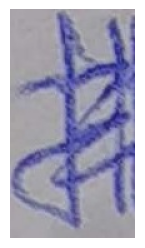

(138, 238, 100)
char_clean=[(0, 23, 100, 182), (51, 155, 5, 6)], char_width=52, char_height=94


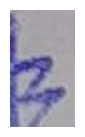

(238, 338, 100)
char_clean=[(0, 30, 100, 159)], char_width=100, char_height=159


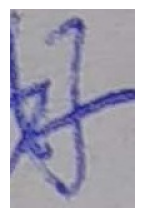

(349, 438, 89)
char_clean=[(0, 24, 89, 166)], char_width=89, char_height=166


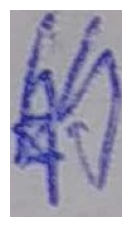

(441, 553, 112)
char_clean=[(0, 1, 112, 203)], char_width=112, char_height=203


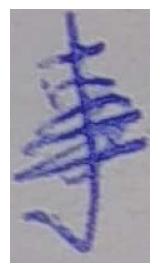

(561, 665, 104)
char_clean=[(0, 1, 104, 163)], char_width=104, char_height=163


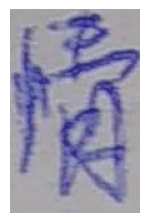

(693, 803, 110)
char_clean=[(0, 10, 110, 139)], char_width=110, char_height=139


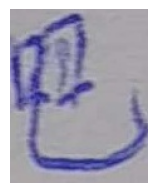

(817, 852, 35)
char_clean=[(0, 106, 35, 39)], char_width=35, char_height=39


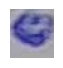

./Cropped/img_10.jpg
height_img=240, width_img=257


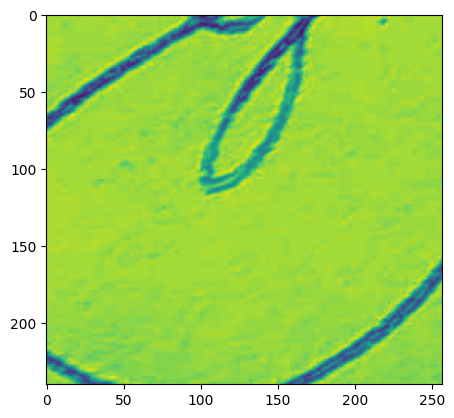

./Cropped/img_11.jpg
height_img=145, width_img=449


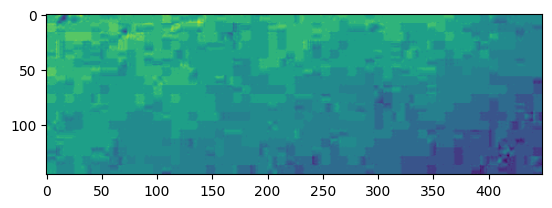

In [19]:
#__________FUNCTIONS

def show_segmentation (img_path:str) -> tuple:
    """
    Affiche la segmentation verticale d'une image en identifiant les points de changement dans le contenu.
    Cette fonction détecte les contours verticaux à l'aide de l'algorithme de Canny et trace des lignes 
    verticales sur l'image pour représenter les transitions entre les zones de texte.

    Parameter:
    img_path (str) : Chemin vers l'image à segmenter.

    Return:
    tuple : Contient une liste des points de changement verticaux (int) et la hauteur de l'image (int).
    """

    print(img_path)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    height_img, width_img = img.shape
    print(f"{height_img=}, {width_img=}")
    edges = cv2.Canny(img,100,200)
    vertical_sum = np.sum(edges, axis=0)
    vertical_sum = vertical_sum != 0
    changes = np.logical_xor(vertical_sum[1:], vertical_sum[:-1])
    change_pts = np.nonzero(changes)[0]

    plt.imshow(img)
    for change in change_pts:
        plt.axvline(change+1)
    plt.show()  

    return change_pts, height_img


def get_characters(pts:list, height:int) -> tuple:
    """
    Classe les segments de texte en fonction de leur longueur pour distinguer les caractères,
    les caractères uniques, et les signes de ponctuation. Renvoie les segments classés ainsi que 
    l'ensemble des segments d'origine.

    Parameters:
    pts (list) : Liste des points de segmentation verticaux dans l'image.
    height (int) : Hauteur moyenne des blocs de texte, utilisée comme référence pour la classification.

    Return:
    tuple : Contient quatre listes de tuples (début, fin, longueur du segment) :
            - characters_unclassed : Segments de caractères de grande longueur.
            - characters_uniq : Segments de caractères uniques (taille moyenne).
            - all_segments : Tous les segments détectés.
            - list_punct : Segments correspondant à des signes de ponctuation (petite taille).
    """

    characters_unclassed = list()
    characters_uniq = list()
    all_segments = list()
    list_punct = list()

    for i in range(0, len(pts)-1, 2):
        lenght =  pts[i+1] - pts[i]
        #print(pts[i], pts[i+1], lenght)
        all_segments.append((int(pts[i]), int(pts[i+1]), int(lenght)))
        if lenght > height:
            characters_unclassed.append((int(pts[i]), int(pts[i+1]), int(lenght)))
        elif lenght <= height and lenght > height/4:
            characters_uniq.append((int(pts[i]), int(pts[i+1]), int(lenght)))
        elif lenght <= height/4 and lenght > height/8:
            list_punct.append((int(pts[i]), int(pts[i+1]), int(lenght)))

    return characters_unclassed, characters_uniq, all_segments, list_punct


def get_average (characters_uniq:list) -> int:
    """
    Calcule la largeur moyenne des caractères uniques dans une liste donnée.
    Si la liste contient plus d'un élément, la moyenne est calculée.
    Si la liste ne contient qu'un seul élément, sa largeur est retournée.
    Si la liste est vide, un message est affiché et la fonction retourne False.

    Parameter:
    characters_uniq (list) : Liste de tuples contenant des informations sur les caractères uniques,
                             où chaque tuple contient (début, fin, largeur).

    Return:
    int : La largeur moyenne des caractères uniques, ou False si la liste est vide.
    """

    width = [char[2] for char in characters_uniq]
    print("Largeurs :", width)
    if len(width) > 1 :  
        average = int(statistics.mean(width))
        print("Moyenne :", average)
        return average
    elif len(width) == 1:
        average = width[0]
        print("Moyenne :", average)
        return average
    else:
        print("Pas de caracteres dans cette image !")


def get_single(characters_unclassed: list) -> list:
    """
    Extrait les caractères individuels d'une liste de caractères non classés.
    Les caractères de largeur inférieure au double de la moyenne sont considérés
    comme des caractères uniques. Les caractères plus larges sont divisés en segments
    égaux selon la moyenne.

    Parameter:
    characters_unclassed (list) : Liste de tuples contenant des informations sur les caractères non classés,
                                   où chaque tuple contient (début, fin, largeur).
    average (int) : La largeur moyenne des caractères uniques, utilisée pour la division.

    Return:
    list : Liste de tuples contenant les segments de caractères uniques extraits.
    """
    
    single_characters = list()
    for element in unclassed:
        if element[2] < average*2:
            single_characters.append(element)
        else:
            div = int(round(element[2] / average, 0))
            interval = int(element[2] / div)
            #print(element, div, interval)
            for i in range(div):
                single_characters.append((element[0]+i*interval, element[0]+i*interval+interval, interval))
    print(f"{single_characters=}")
    return single_characters

#__________CALL

crop_directory = "./Cropped/*.jpg"

empty_directory(f"./Char/{file_name}")

count_char = 0
for crop_file in glob.glob(crop_directory):
    img_segment = cv2.imread(crop_file)
    points, height_img = show_segmentation(crop_file)
    unclassed, unique, segments, punct = get_characters(points, height_img)

    if unique != []:
        print(f"{unclassed=}")
        print(f"{unique=}")
        print(f"{segments=}")
        print(f"{punct=}")

        average = get_average(unique)

        single = get_single(unclassed)

        characters = list(set(unique + single + punct))
        characters = sorted(characters, key=lambda x: x[0])
        print(f"Nombre de caractère prédit par image: {len(characters)}, {characters}")

        for char in characters:
            print(char)
            x = char[0]
            y = 0
            width = char[-1]
            height = height_img
            cropped_char = img_segment[y:y + height, x:x + width] # Découper l'image
            char_clean, char_width, char_height = get_selection(cropped_char)
            char_x = char_clean[0][0]
            char_y = char_clean[0][1]
            print(f"{char_clean=}, {char_width=}, {char_height=}")
            cropped_char_clean = cropped_char[char_y:char_y + char_height, char_x:char_x + char_width]
            cropped_file = f"./Char/{file_name}/img_{count_char}.jpg"
            cv2.imwrite(cropped_file, cropped_char_clean) # Sauvegarder
            display(cropped_file) # Afficher
            count_char += 1